In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv('cleaned_data.csv')

df.head()

,Transportation,Regular_fiber_diet,Diagnostic_in_family_history,High_calorie_diet,Sedentary_hours_daily,Age,Alcohol,Est_avg_calorie_intake,Main_meals_daily,Snacks,Height,Smoker,Water_daily,Calorie_monitoring,Weight,Physical_activity_level,Technology_time_use,Gender,Diagnostic
0,Public_Transportation,2.0,True,False,3.73,21.0,no,2474,3.0,Sometimes,1.62,False,2.0,False,64.0,0.0,1.0,Female,D1
1,Public_Transportation,3.0,True,False,2.92,21.0,Sometimes,2429,3.0,Sometimes,1.52,True,3.0,True,56.0,3.0,0.0,Female,D1
2,Public_Transportation,2.0,True,False,3.85,23.0,Frequently,2656,3.0,Sometimes,1.80,False,2.0,False,77.0,2.0,1.0,Male,D1
3,Walking,3.0,False,False,3.01,27.0,Frequently,2260,3.0,Sometimes,1.80,False,2.0,False,-1.0,2.0,0.0,Male,D2
4,Public_Transportation,2.0,False,False,2.73,22.0,Sometimes,1895,1.0,Sometimes,1.78,False,2.0,False,89.8,0.0,0.0,Male,D3


In [3]:
prediction_target = 'Diagnostic'
numerical_attributes = ['Regular_fiber_diet', 'Sedentary_hours_daily', 'Age', 'Est_avg_calorie_intake', 'Main_meals_daily', 'Height', 'Water_daily', 'Weight', 'Physical_activity_level', 'Technology_time_use']
categorical_attributes = ['Transportation', 'Diagnostic_in_family_history', 'High_calorie_diet', 'Alcohol', 'Snacks', 'Smoker', 'Calorie_monitoring', 'Gender']

In [4]:
# 3.1.1: class distribution

def plot_class_distribution(df):
    plt.figure(figsize=(10, 6))
    distribution_df = df.groupby(prediction_target).count()

    class_plot = sns.barplot(data=distribution_df, x=prediction_target, y=numerical_attributes[0], legend=False, hue=prediction_target, palette='viridis')
    class_plot.set(xlabel='Classes', ylabel='Frequency')
    plt.show()

In [5]:
# make 10 random splits

random_splits = []

for _ in range(10):
    train_df, test_df = train_test_split(df, shuffle=True, test_size=0.2)
    random_splits.append((train_df, test_df))

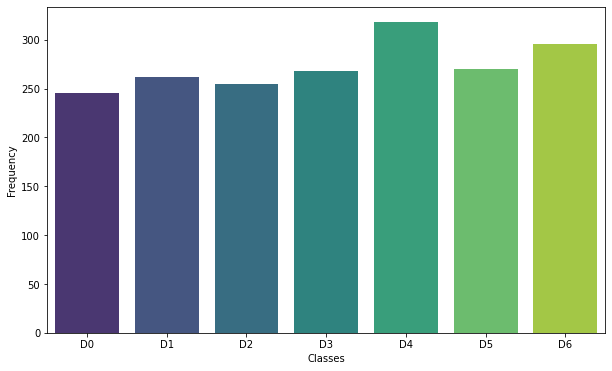

In [6]:
plot_class_distribution(df)

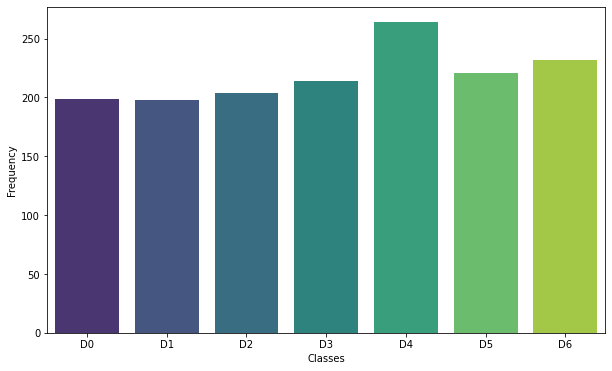

In [7]:
plot_class_distribution(random_splits[0][0])

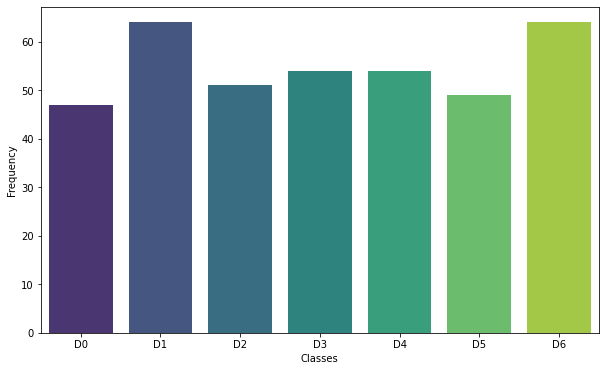

In [8]:
plot_class_distribution(random_splits[0][1])

In [9]:
results = {
    "name": [],
    "mean": [],
    "stddev": [],
    "mean-abs-deviation": [],
    "min": [],
    "max": [],
    "amplitude": [],
    "median": [],
    "median-abs-deviation": [],
    "interquartile-range": []
}

for attribute in numerical_attributes:
    results["name"].append(attribute)
    results["mean"].append(df[attribute].mean())
    results["stddev"].append(df[attribute].std())
    results["mean-abs-deviation"].append(abs(df[attribute] - df[attribute].mean()).mean())
    results["min"].append(df[attribute].min())
    results["max"].append(df[attribute].max())
    results["amplitude"].append(df[attribute].max() - df[attribute].min())
    results["median"].append(df[attribute].median())
    results["median-abs-deviation"].append(abs(df[attribute] - df[attribute].median()).median())
    results["interquartile-range"].append(df[attribute].quantile())

results = pd.DataFrame(results)

In [10]:
results

,name,mean,stddev,mean-abs-deviation,min,max,amplitude,median,median-abs-deviation,interquartile-range
0,Regular_fiber_diet,3.849691,62.537347,2.856554,1.00,2739.000000,2738.000000,2.392179,0.392179,2.392179
1,Sedentary_hours_daily,3.196131,0.575311,0.470475,2.21,4.670000,2.460000,3.130000,0.440000,3.130000
2,Age,24.361597,6.412790,4.816802,15.00,61.000000,46.000000,22.829753,3.170247,22.829753
3,Est_avg_calorie_intake,2253.650131,433.789209,374.951932,1500.00,3000.000000,1500.000000,2253.000000,378.000000,2253.000000
4,Main_meals_daily,2.683221,0.779093,0.595155,1.00,4.000000,3.000000,3.000000,0.000000,3.000000
5,Height,1.702364,0.093342,0.077138,1.45,1.980000,0.530000,1.700000,0.070000,1.700000
6,Water_daily,2.010292,0.611308,0.471015,1.00,3.000000,2.000000,2.000000,0.445075,2.000000
7,Weight,78.109515,36.205498,27.958138,-1.00,165.057269,166.057269,80.351263,24.351263,80.351263
8,Physical_activity_level,1.011979,0.854715,0.701005,0.00,3.000000,3.000000,1.000000,0.815083,1.000000
9,Technology_time_use,0.665796,0.675017,0.600086,0.00,2.000000,2.000000,1.000000,1.000000,1.000000


Uniques for attribute Transportation: ['Public_Transportation' 'Walking' 'Automobile' 'Motorbike' 'Bike']


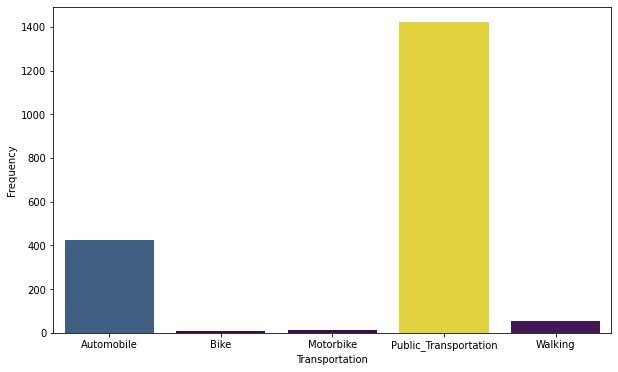

Uniques for attribute Diagnostic_in_family_history: [ True False]


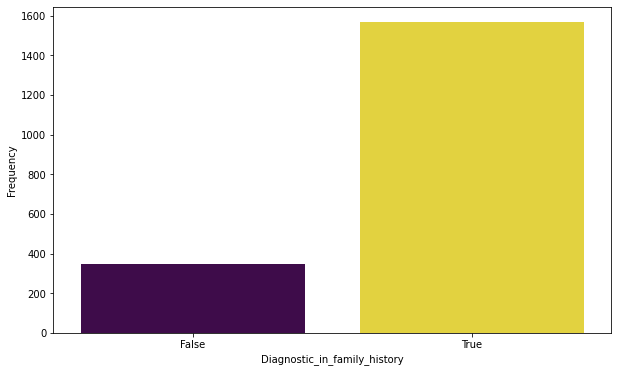

Uniques for attribute High_calorie_diet: [False  True]


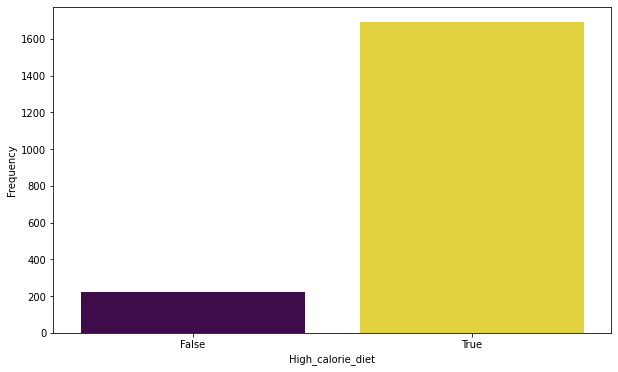

Uniques for attribute Alcohol: ['no' 'Sometimes' 'Frequently' 'Always']


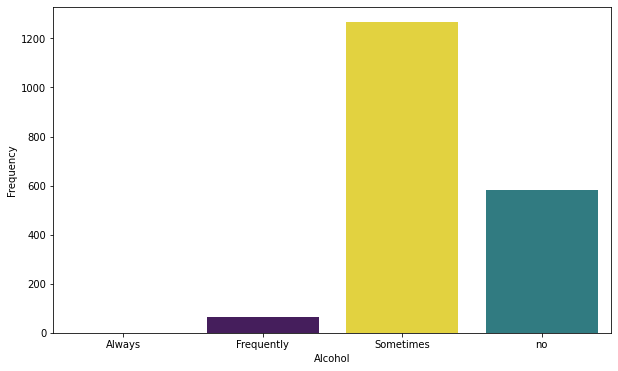

Uniques for attribute Snacks: ['Sometimes' 'Frequently' 'Always' 'no']


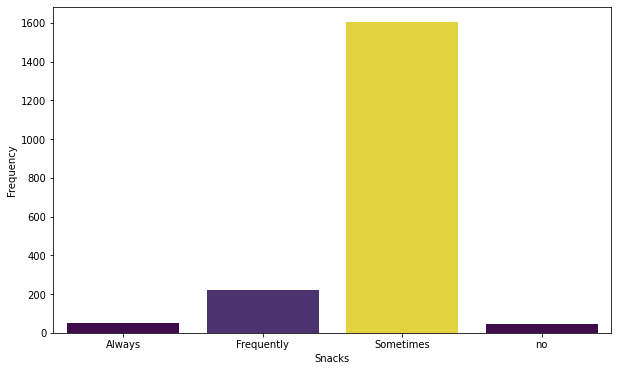

Uniques for attribute Smoker: [False  True]


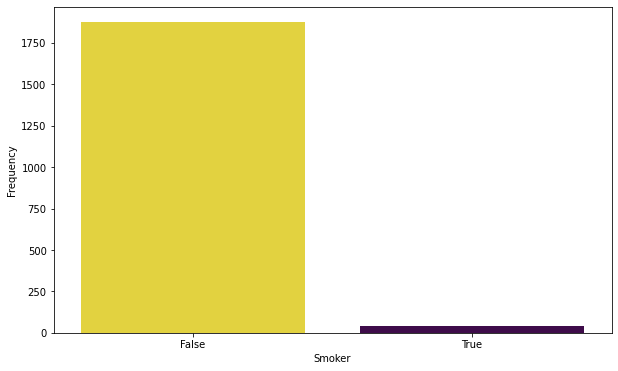

Uniques for attribute Calorie_monitoring: [False  True]


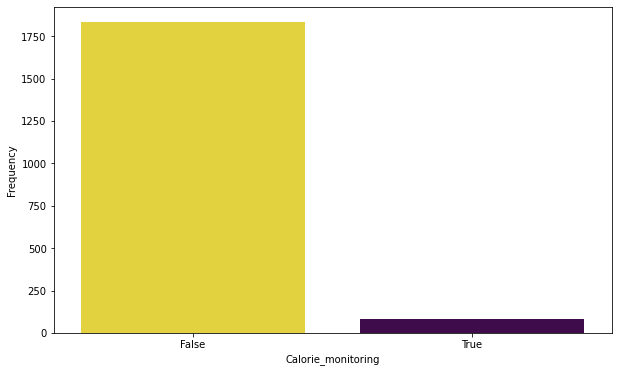

Uniques for attribute Gender: ['Female' 'Male']


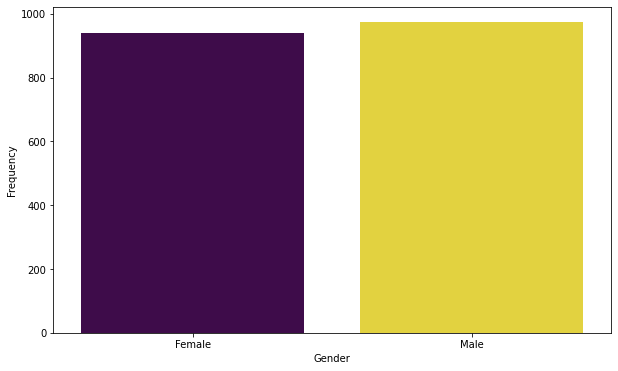

In [11]:
def plot_attribute_distribution(df, attribute):
    plt.figure(figsize=(10, 6))
    distribution_df = df.groupby(attribute).count()

    class_plot = sns.barplot(data=distribution_df, x=attribute, y=numerical_attributes[0], legend=False, hue=prediction_target, palette='viridis')
    class_plot.set(xlabel=attribute, ylabel='Frequency')
    plt.show()

for attribute in categorical_attributes:
    print(f"Uniques for attribute {attribute}: {df[attribute].unique()}")
    plot_attribute_distribution(df, attribute)

In [12]:
# sns.pairplot(df)

In [13]:
len(df.columns)

19

<Axes: >

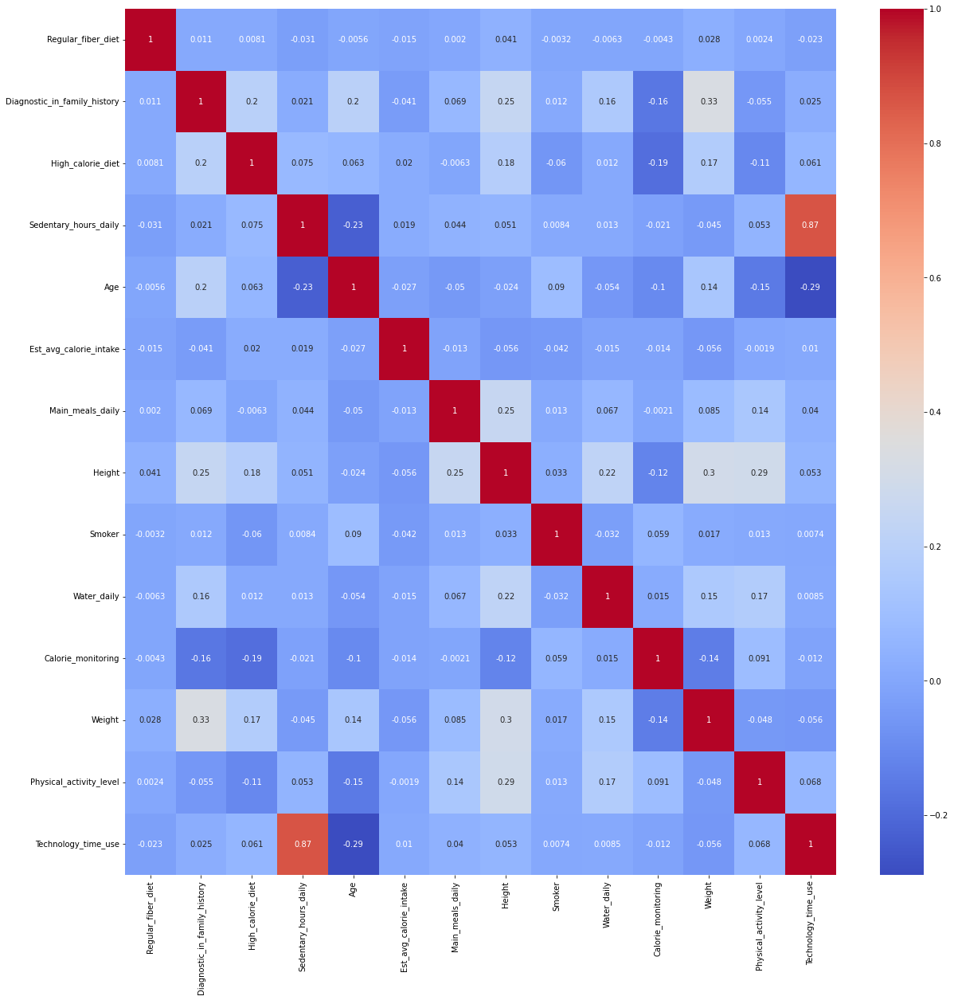

In [14]:
plt.figure(figsize=(20, 20))
sns.heatmap(df.corr(method='pearson'), annot=True, cmap='coolwarm') # nu sunt cuprinse atributele cu type == 'object'

<Axes: >

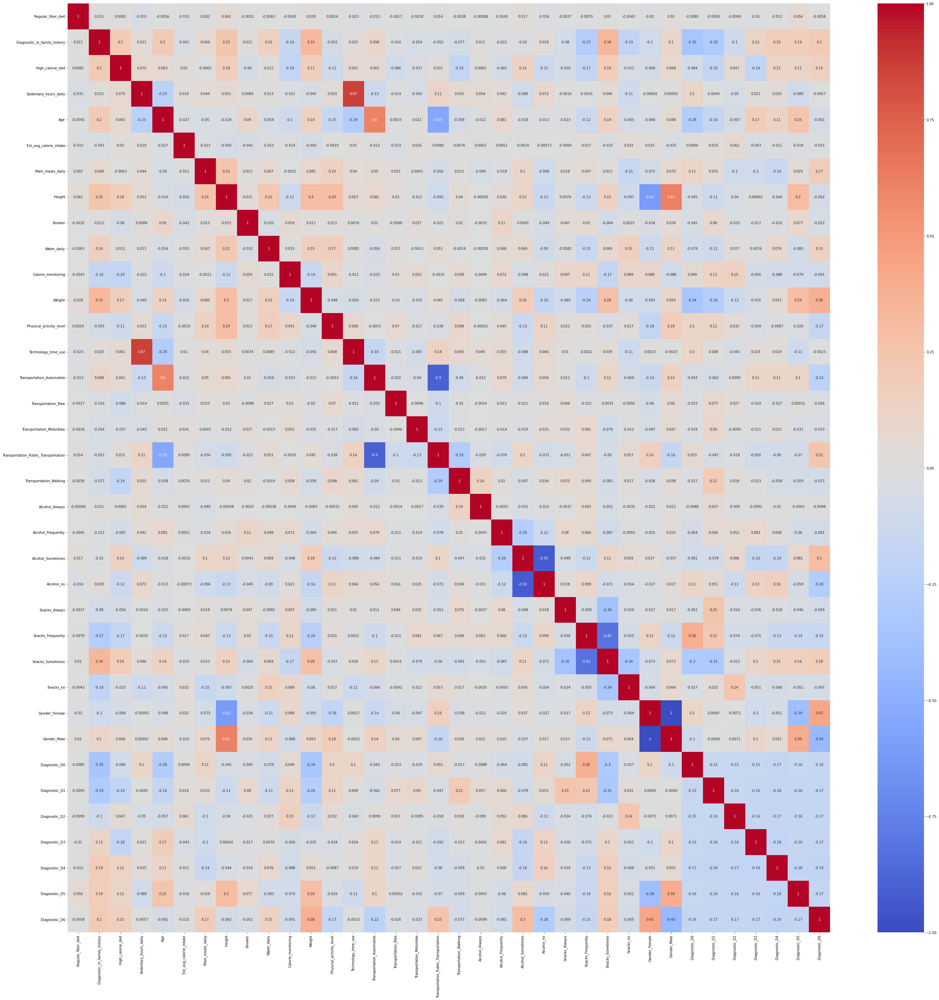

In [15]:
encoded_df = pd.get_dummies(df)

plt.figure(figsize=(50, 50))
sns.heatmap(encoded_df.corr(method='pearson'), annot=True, cmap='coolwarm')

In [16]:
# plt.figure(figsize=(50, 50))

# sns.pairplot(encoded_df)

In [17]:
encoded_df.head()

,Regular_fiber_diet,Diagnostic_in_family_history,High_calorie_diet,Sedentary_hours_daily,Age,Est_avg_calorie_intake,Main_meals_daily,Height,Smoker,Water_daily,...,Snacks_no,Gender_Female,Gender_Male,Diagnostic_D0,Diagnostic_D1,Diagnostic_D2,Diagnostic_D3,Diagnostic_D4,Diagnostic_D5,Diagnostic_D6
0,2.0,True,False,3.73,21.0,2474,3.0,1.62,False,2.0,...,0,1,0,0,1,0,0,0,0,0
1,3.0,True,False,2.92,21.0,2429,3.0,1.52,True,3.0,...,0,1,0,0,1,0,0,0,0,0
2,2.0,True,False,3.85,23.0,2656,3.0,1.80,False,2.0,...,0,0,1,0,1,0,0,0,0,0
3,3.0,False,False,3.01,27.0,2260,3.0,1.80,False,2.0,...,0,0,1,0,0,1,0,0,0,0
4,2.0,False,False,2.73,22.0,1895,1.0,1.78,False,2.0,...,0,0,1,0,0,0,1,0,0,0


In [18]:
encoded_df.dtypes

Regular_fiber_diet                      float64
Diagnostic_in_family_history               bool
High_calorie_diet                          bool
Sedentary_hours_daily                   float64
Age                                     float64
Est_avg_calorie_intake                    int64
Main_meals_daily                        float64
Height                                  float64
Smoker                                     bool
Water_daily                             float64
Calorie_monitoring                         bool
Weight                                  float64
Physical_activity_level                 float64
Technology_time_use                     float64
Transportation_Automobile                 uint8
Transportation_Bike                       uint8
Transportation_Motorbike                  uint8
Transportation_Public_Transportation      uint8
Transportation_Walking                    uint8
Alcohol_Always                            uint8
Alcohol_Frequently                      

In [19]:
df.head()

,Transportation,Regular_fiber_diet,Diagnostic_in_family_history,High_calorie_diet,Sedentary_hours_daily,Age,Alcohol,Est_avg_calorie_intake,Main_meals_daily,Snacks,Height,Smoker,Water_daily,Calorie_monitoring,Weight,Physical_activity_level,Technology_time_use,Gender,Diagnostic
0,Public_Transportation,2.0,True,False,3.73,21.0,no,2474,3.0,Sometimes,1.62,False,2.0,False,64.0,0.0,1.0,Female,D1
1,Public_Transportation,3.0,True,False,2.92,21.0,Sometimes,2429,3.0,Sometimes,1.52,True,3.0,True,56.0,3.0,0.0,Female,D1
2,Public_Transportation,2.0,True,False,3.85,23.0,Frequently,2656,3.0,Sometimes,1.80,False,2.0,False,77.0,2.0,1.0,Male,D1
3,Walking,3.0,False,False,3.01,27.0,Frequently,2260,3.0,Sometimes,1.80,False,2.0,False,-1.0,2.0,0.0,Male,D2
4,Public_Transportation,2.0,False,False,2.73,22.0,Sometimes,1895,1.0,Sometimes,1.78,False,2.0,False,89.8,0.0,0.0,Male,D3


In [20]:
df.drop(columns=['Regular_fiber_diet', 'Est_avg_calorie_intake', 'Smoker', 'Sedentary_hours_daily'], inplace=True)

df.head()

,Transportation,Diagnostic_in_family_history,High_calorie_diet,Age,Alcohol,Main_meals_daily,Snacks,Height,Water_daily,Calorie_monitoring,Weight,Physical_activity_level,Technology_time_use,Gender,Diagnostic
0,Public_Transportation,True,False,21.0,no,3.0,Sometimes,1.62,2.0,False,64.0,0.0,1.0,Female,D1
1,Public_Transportation,True,False,21.0,Sometimes,3.0,Sometimes,1.52,3.0,True,56.0,3.0,0.0,Female,D1
2,Public_Transportation,True,False,23.0,Frequently,3.0,Sometimes,1.80,2.0,False,77.0,2.0,1.0,Male,D1
3,Walking,False,False,27.0,Frequently,3.0,Sometimes,1.80,2.0,False,-1.0,2.0,0.0,Male,D2
4,Public_Transportation,False,False,22.0,Sometimes,1.0,Sometimes,1.78,2.0,False,89.8,0.0,0.0,Male,D3


In [21]:
df['Diagnostic_in_family_history'] = df['Diagnostic_in_family_history'].astype(float)
df['High_calorie_diet'] = df['High_calorie_diet'].astype(float)
df['High_calorie_diet'] = df['High_calorie_diet'].astype(float)
df['Calorie_monitoring'] = df['Calorie_monitoring'].astype(float)

In [22]:
df.head()

,Transportation,Diagnostic_in_family_history,High_calorie_diet,Age,Alcohol,Main_meals_daily,Snacks,Height,Water_daily,Calorie_monitoring,Weight,Physical_activity_level,Technology_time_use,Gender,Diagnostic
0,Public_Transportation,1.0,0.0,21.0,no,3.0,Sometimes,1.62,2.0,0.0,64.0,0.0,1.0,Female,D1
1,Public_Transportation,1.0,0.0,21.0,Sometimes,3.0,Sometimes,1.52,3.0,1.0,56.0,3.0,0.0,Female,D1
2,Public_Transportation,1.0,0.0,23.0,Frequently,3.0,Sometimes,1.80,2.0,0.0,77.0,2.0,1.0,Male,D1
3,Walking,0.0,0.0,27.0,Frequently,3.0,Sometimes,1.80,2.0,0.0,-1.0,2.0,0.0,Male,D2
4,Public_Transportation,0.0,0.0,22.0,Sometimes,1.0,Sometimes,1.78,2.0,0.0,89.8,0.0,0.0,Male,D3


In [23]:
df.dtypes

Transportation                   object
Diagnostic_in_family_history    float64
High_calorie_diet               float64
Age                             float64
Alcohol                          object
Main_meals_daily                float64
Snacks                           object
Height                          float64
Water_daily                     float64
Calorie_monitoring              float64
Weight                          float64
Physical_activity_level         float64
Technology_time_use             float64
Gender                           object
Diagnostic                       object
dtype: object

In [24]:
df['Gender'] = df['Gender'].apply(lambda s: s == "Male").astype(float)

df.head()

,Transportation,Diagnostic_in_family_history,High_calorie_diet,Age,Alcohol,Main_meals_daily,Snacks,Height,Water_daily,Calorie_monitoring,Weight,Physical_activity_level,Technology_time_use,Gender,Diagnostic
0,Public_Transportation,1.0,0.0,21.0,no,3.0,Sometimes,1.62,2.0,0.0,64.0,0.0,1.0,0.0,D1
1,Public_Transportation,1.0,0.0,21.0,Sometimes,3.0,Sometimes,1.52,3.0,1.0,56.0,3.0,0.0,0.0,D1
2,Public_Transportation,1.0,0.0,23.0,Frequently,3.0,Sometimes,1.80,2.0,0.0,77.0,2.0,1.0,1.0,D1
3,Walking,0.0,0.0,27.0,Frequently,3.0,Sometimes,1.80,2.0,0.0,-1.0,2.0,0.0,1.0,D2
4,Public_Transportation,0.0,0.0,22.0,Sometimes,1.0,Sometimes,1.78,2.0,0.0,89.8,0.0,0.0,1.0,D3


In [25]:
df.dtypes

Transportation                   object
Diagnostic_in_family_history    float64
High_calorie_diet               float64
Age                             float64
Alcohol                          object
Main_meals_daily                float64
Snacks                           object
Height                          float64
Water_daily                     float64
Calorie_monitoring              float64
Weight                          float64
Physical_activity_level         float64
Technology_time_use             float64
Gender                          float64
Diagnostic                       object
dtype: object

In [26]:
columns_to_encode = ['Transportation', 'Alcohol', 'Snacks']

encoded_cols = pd.get_dummies(df[columns_to_encode], prefix=columns_to_encode)

dataset = pd.concat([df.drop(columns=columns_to_encode), encoded_cols], axis=1)

dataset.head()

,Diagnostic_in_family_history,High_calorie_diet,Age,Main_meals_daily,Height,Water_daily,Calorie_monitoring,Weight,Physical_activity_level,Technology_time_use,...,Transportation_Public_Transportation,Transportation_Walking,Alcohol_Always,Alcohol_Frequently,Alcohol_Sometimes,Alcohol_no,Snacks_Always,Snacks_Frequently,Snacks_Sometimes,Snacks_no
0,1.0,0.0,21.0,3.0,1.62,2.0,0.0,64.0,0.0,1.0,...,1,0,0,0,0,1,0,0,1,0
1,1.0,0.0,21.0,3.0,1.52,3.0,1.0,56.0,3.0,0.0,...,1,0,0,0,1,0,0,0,1,0
2,1.0,0.0,23.0,3.0,1.80,2.0,0.0,77.0,2.0,1.0,...,1,0,0,1,0,0,0,0,1,0
3,0.0,0.0,27.0,3.0,1.80,2.0,0.0,-1.0,2.0,0.0,...,0,1,0,1,0,0,0,0,1,0
4,0.0,0.0,22.0,1.0,1.78,2.0,0.0,89.8,0.0,0.0,...,1,0,0,0,1,0,0,0,1,0


In [27]:
column = dataset.pop('Diagnostic')
dataset['Diagnostic'] = column # move the column to be the last column

In [28]:
dataset.head()

,Diagnostic_in_family_history,High_calorie_diet,Age,Main_meals_daily,Height,Water_daily,Calorie_monitoring,Weight,Physical_activity_level,Technology_time_use,...,Transportation_Walking,Alcohol_Always,Alcohol_Frequently,Alcohol_Sometimes,Alcohol_no,Snacks_Always,Snacks_Frequently,Snacks_Sometimes,Snacks_no,Diagnostic
0,1.0,0.0,21.0,3.0,1.62,2.0,0.0,64.0,0.0,1.0,...,0,0,0,0,1,0,0,1,0,D1
1,1.0,0.0,21.0,3.0,1.52,3.0,1.0,56.0,3.0,0.0,...,0,0,0,1,0,0,0,1,0,D1
2,1.0,0.0,23.0,3.0,1.80,2.0,0.0,77.0,2.0,1.0,...,0,0,1,0,0,0,0,1,0,D1
3,0.0,0.0,27.0,3.0,1.80,2.0,0.0,-1.0,2.0,0.0,...,1,0,1,0,0,0,0,1,0,D2
4,0.0,0.0,22.0,1.0,1.78,2.0,0.0,89.8,0.0,0.0,...,0,0,0,1,0,0,0,1,0,D3


In [29]:
for attribute in dataset.columns:
    if attribute == 'Diagnostic':
        continue
    dataset[attribute] = dataset[attribute].astype(float)

In [30]:
dataset.head()

,Diagnostic_in_family_history,High_calorie_diet,Age,Main_meals_daily,Height,Water_daily,Calorie_monitoring,Weight,Physical_activity_level,Technology_time_use,...,Transportation_Walking,Alcohol_Always,Alcohol_Frequently,Alcohol_Sometimes,Alcohol_no,Snacks_Always,Snacks_Frequently,Snacks_Sometimes,Snacks_no,Diagnostic
0,1.0,0.0,21.0,3.0,1.62,2.0,0.0,64.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,D1
1,1.0,0.0,21.0,3.0,1.52,3.0,1.0,56.0,3.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,D1
2,1.0,0.0,23.0,3.0,1.80,2.0,0.0,77.0,2.0,1.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,D1
3,0.0,0.0,27.0,3.0,1.80,2.0,0.0,-1.0,2.0,0.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,D2
4,0.0,0.0,22.0,1.0,1.78,2.0,0.0,89.8,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,D3


In [31]:
dataset['Weight'] = dataset['Weight'].apply(lambda x: np.nan if x < 0 else x)

dataset.head()

,Diagnostic_in_family_history,High_calorie_diet,Age,Main_meals_daily,Height,Water_daily,Calorie_monitoring,Weight,Physical_activity_level,Technology_time_use,...,Transportation_Walking,Alcohol_Always,Alcohol_Frequently,Alcohol_Sometimes,Alcohol_no,Snacks_Always,Snacks_Frequently,Snacks_Sometimes,Snacks_no,Diagnostic
0,1.0,0.0,21.0,3.0,1.62,2.0,0.0,64.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,D1
1,1.0,0.0,21.0,3.0,1.52,3.0,1.0,56.0,3.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,D1
2,1.0,0.0,23.0,3.0,1.80,2.0,0.0,77.0,2.0,1.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,D1
3,0.0,0.0,27.0,3.0,1.80,2.0,0.0,NaN,2.0,0.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,D2
4,0.0,0.0,22.0,1.0,1.78,2.0,0.0,89.8,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,D3


In [32]:
# fill in the dataset columns

from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

imputer = IterativeImputer(max_iter=10, random_state=42)

X = dataset.iloc[:, 0:-1].values
y = dataset.iloc[:, -1].values

imputed_X = imputer.fit_transform(X)

new_df = pd.DataFrame(np.concatenate([imputed_X, y.reshape(-1, 1)], axis=1), columns=dataset.columns)

new_df.head()

,Diagnostic_in_family_history,High_calorie_diet,Age,Main_meals_daily,Height,Water_daily,Calorie_monitoring,Weight,Physical_activity_level,Technology_time_use,...,Transportation_Walking,Alcohol_Always,Alcohol_Frequently,Alcohol_Sometimes,Alcohol_no,Snacks_Always,Snacks_Frequently,Snacks_Sometimes,Snacks_no,Diagnostic
0,1.0,0.0,21.0,3.0,1.62,2.0,0.0,64.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,D1
1,1.0,0.0,21.0,3.0,1.52,3.0,1.0,56.0,3.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,D1
2,1.0,0.0,23.0,3.0,1.8,2.0,0.0,77.0,2.0,1.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,D1
3,0.0,0.0,27.0,3.0,1.8,2.0,0.0,70.872777,2.0,0.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,D2
4,0.0,0.0,22.0,1.0,1.78,2.0,0.0,89.8,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,D3


In [34]:
new_df.to_csv('nn_data.csv', index=False)

In [33]:
new_df.isna().any() # should output False everywhere

Diagnostic_in_family_history            False
High_calorie_diet                       False
Age                                     False
Main_meals_daily                        False
Height                                  False
Water_daily                             False
Calorie_monitoring                      False
Weight                                  False
Physical_activity_level                 False
Technology_time_use                     False
Gender                                  False
Transportation_Automobile               False
Transportation_Bike                     False
Transportation_Motorbike                False
Transportation_Public_Transportation    False
Transportation_Walking                  False
Alcohol_Always                          False
Alcohol_Frequently                      False
Alcohol_Sometimes                       False
Alcohol_no                              False
Snacks_Always                           False
Snacks_Frequently                 

In [59]:
# now let's select columns

from sklearn.feature_selection import SelectPercentile, chi2

selector = SelectPercentile(chi2, percentile=75)

X = new_df.iloc[:, 0:-1].values
y = new_df.iloc[:, -1].values

new_X = selector.fit_transform(X, y)

columns = list(new_df.columns[selector.get_support(indices=True)])
columns.append(prediction_target)

# print(columns)
print(set(new_df.columns) - set(columns))
final_df = pd.DataFrame(np.concatenate([new_X, y.reshape(-1, 1)], axis=1), columns=columns)

final_df.head()

{'Transportation_Motorbike', 'High_calorie_diet', 'Water_daily', 'Transportation_Bike', 'Height', 'Alcohol_Always'}


,Diagnostic_in_family_history,Age,Main_meals_daily,Calorie_monitoring,Weight,Physical_activity_level,Technology_time_use,Gender,Transportation_Automobile,Transportation_Public_Transportation,Transportation_Walking,Alcohol_Frequently,Alcohol_Sometimes,Alcohol_no,Snacks_Always,Snacks_Frequently,Snacks_Sometimes,Snacks_no,Diagnostic
0,1.0,21.0,3.0,0.0,64.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,D1
1,1.0,21.0,3.0,1.0,56.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,D1
2,1.0,23.0,3.0,0.0,77.0,2.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,D1
3,0.0,27.0,3.0,0.0,70.872777,2.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,D2
4,0.0,22.0,1.0,0.0,89.8,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,D3


In [60]:
# now we have our final df

X = final_df.iloc[:, 0:-1].values
y = final_df.iloc[:, -1].values

In [61]:
X

array([[1.0, 21.0, 3.0, ..., 0.0, 1.0, 0.0],
       [1.0, 21.0, 3.0, ..., 0.0, 1.0, 0.0],
       [1.0, 23.0, 3.0, ..., 0.0, 1.0, 0.0],
       ...,
       [1.0, 22.524036, 3.0, ..., 0.0, 1.0, 0.0],
       [1.0, 24.361936, 3.0, ..., 0.0, 1.0, 0.0],
       [1.0, 23.664709, 3.0, ..., 0.0, 1.0, 0.0]], dtype=object)

In [62]:
# scaling with StandardScaler

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

X = scaler.fit_transform(X)

In [63]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC

In [64]:
from sklearn.model_selection import GridSearchCV

In [65]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [68]:
# 1. Grid Search for SVC

params = {
    "kernel": ['linear', 'rbf', 'poly'],
    'C': list(np.logspace(-3, 3, 7, base=10))
}

model = SVC()

grid_search = GridSearchCV(estimator=SVC(), param_grid=params, cv=5)

grid_search.fit(X_train, y_train)

results = grid_search.predict(X_test)

In [69]:
from sklearn.metrics import accuracy_score

accuracy_score(results, y_test)

0.7859007832898173

In [72]:
grid_search.best_params_

{'C': 10.0, 'kernel': 'rbf'}

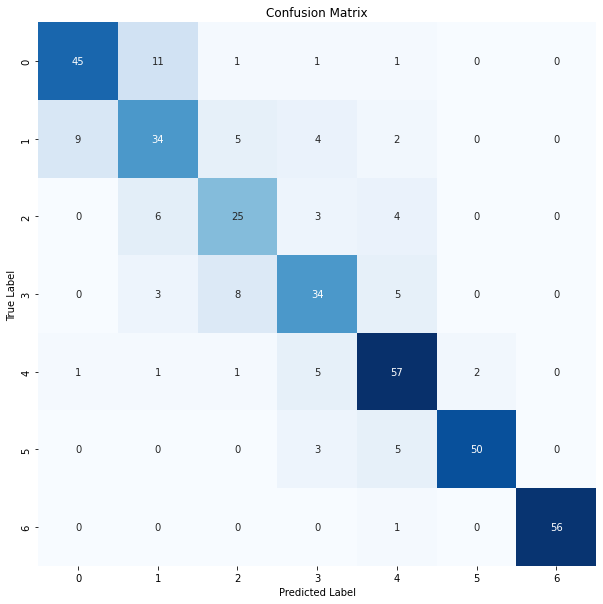

In [78]:
from sklearn.metrics import plot_confusion_matrix, confusion_matrix

plt.figure(figsize=(10, 10))
sns.heatmap(confusion_matrix(y_test, results), annot=True, cmap='Blues', fmt='g', cbar=False)
plt.title('Confusion Matrix for SVM')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [79]:
random_splits = []

for _ in range(10):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
    random_splits.append((X_train, X_test, y_train, y_test))

In [84]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score

svm_results = {
    'Kernel': [],
    'C': [],
    'Accuracy_mean': [],
    'Accuracy_std': []
}

labels = ['D' + str(i) for i in range(7)]

for label in labels:
    svm_results["Precision_mean_" + label] = []
    svm_results["Precision_std_" + label] = []
    svm_results["Recall_mean_" + label] = []
    svm_results["Recall_std_" + label] = []
    svm_results["F1_score_mean_" + label] = []
    svm_results["F1_score_std_" + label] = []

for kernel in params['kernel']:
    for C in params['C']:
        model_results = {}
        model_results['acc'] = []
        
        for label in labels:
            model_results['P ' + label] = []
            model_results['R ' + label] = []
            model_results['F1 ' + label] = []
        
        model = SVC(C=C, kernel=kernel)

        for (X_train, X_test, y_train, y_test) in random_splits:
            model.fit(X_train, y_train)
            y_pred = model.predict(X_test)

            model_results['acc'].append(accuracy_score(y_test, y_pred))
            
            for label in labels:
                model_results['P ' + label].append(precision_score(y_test, y_pred, average='macro', pos_label=label))
                model_results['R ' + label].append(recall_score(y_test, y_pred, average='macro', pos_label=label))
                model_results['F1 ' + label].append(f1_score(y_test, y_pred, average='macro', pos_label=label))
        
        svm_results['Kernel'].append(kernel)
        svm_results['C'].append(C)
        svm_results['Accuracy_mean'].append(np.mean(model_results['acc']))
        svm_results['Accuracy_std'].append(np.std(model_results['acc']))

        for label in labels:
            svm_results['Precision_mean_' + label].append(np.mean(model_results['P ' + label]))
            svm_results['Recall_mean_' + label].append(np.mean(model_results['R ' + label]))
            svm_results['F1_score_mean_' + label].append(np.mean(model_results['F1 ' + label]))
            svm_results['Precision_std_' + label].append(np.std(model_results['P ' + label]))
            svm_results['Recall_std_' + label].append(np.std(model_results['R ' + label]))
            svm_results['F1_score_std_' + label].append(np.std(model_results['F1 ' + label]))

svm_df = pd.DataFrame(svm_results)

svm_df.head()

/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1370: UserWarning: Note that pos_label (set to 'D0') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1370: UserWarning: Note that pos_label (set to 'D0') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1370: UserWarning: Note that pos_label (set to 'D0') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1370: UserWarning: Note that pos_label (set to 'D1') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to sp

,Kernel,C,Accuracy_mean,Accuracy_std,Precision_mean_D0,Precision_std_D0,Recall_mean_D0,Recall_std_D0,F1_score_mean_D0,F1_score_std_D0,...,Recall_mean_D5,Recall_std_D5,F1_score_mean_D5,F1_score_std_D5,Precision_mean_D6,Precision_std_D6,Recall_mean_D6,Recall_std_D6,F1_score_mean_D6,F1_score_std_D6
0,linear,0.001,0.405483,0.032297,0.431147,0.071255,0.386345,0.029323,0.315796,0.041832,...,0.386345,0.029323,0.315796,0.041832,0.431147,0.071255,0.386345,0.029323,0.315796,0.041832
1,linear,0.010,0.627937,0.015458,0.616896,0.016223,0.617504,0.010896,0.594880,0.012553,...,0.617504,0.010896,0.594880,0.012553,0.616896,0.016223,0.617504,0.010896,0.594880,0.012553
2,linear,0.100,0.731332,0.010276,0.727519,0.015564,0.725422,0.015069,0.720888,0.014728,...,0.725422,0.015069,0.720888,0.014728,0.727519,0.015564,0.725422,0.015069,0.720888,0.014728
3,linear,1.000,0.744909,0.011324,0.740453,0.013953,0.738478,0.014216,0.735396,0.014114,...,0.738478,0.014216,0.735396,0.014114,0.740453,0.013953,0.738478,0.014216,0.735396,0.014114
4,linear,10.000,0.747520,0.010832,0.742078,0.016297,0.740339,0.017938,0.737385,0.017048,...,0.740339,0.017938,0.737385,0.017048,0.742078,0.016297,0.740339,0.017938,0.737385,0.017048


In [85]:
svm_df.to_csv('svm_results.csv')

In [89]:
# 2. Grid Search for Random Forest

params = {
    "n_estimators": [10, 100, 1000],
    'max_depth': list(np.linspace(3, 12, 4)),
    'criterion': ['gini', 'entropy'],
    'max_samples': list(np.linspace(0.2, 1.0, 3)),
}

model = RandomForestClassifier()

grid_search = GridSearchCV(estimator=model, param_grid=params, cv=5)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

grid_search.fit(X_train, y_train)

results = grid_search.predict(X_test)

In [90]:
from sklearn.metrics import accuracy_score

accuracy_score(results, y_test)

0.8590078328981723

In [91]:
grid_search.best_params_

{'criterion': 'entropy',
 'max_depth': 12.0,
 'max_samples': 1.0,
 'n_estimators': 100}

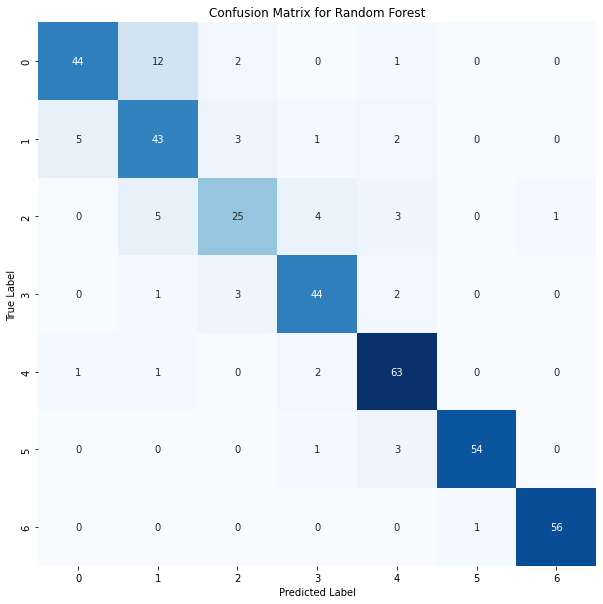

In [92]:
from sklearn.metrics import plot_confusion_matrix, confusion_matrix

plt.figure(figsize=(10, 10))
sns.heatmap(confusion_matrix(y_test, results), annot=True, cmap='Blues', fmt='g', cbar=False)
plt.title('Confusion Matrix for Random Forest')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [93]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score

rf_results = {
    'Number_of_estimators': [],
    'Criterion': [],
    'Max_samples': [],
    'Max_depth': [],
    'Accuracy_mean': [],
    'Accuracy_std': []
}

labels = ['D' + str(i) for i in range(7)]

for label in labels:
    rf_results["Precision_mean_" + label] = []
    rf_results["Precision_std_" + label] = []
    rf_results["Recall_mean_" + label] = []
    rf_results["Recall_std_" + label] = []
    rf_results["F1_score_mean_" + label] = []
    rf_results["F1_score_std_" + label] = []

for n_estimators in params['n_estimators']:
    for criterion in params['criterion']:
        for max_samples in params['max_samples']:
            for max_depth in params['max_depth']:
                model_results = {}
                model_results['acc'] = []
                
                for label in labels:
                    model_results['P ' + label] = []
                    model_results['R ' + label] = []
                    model_results['F1 ' + label] = []
                
                model = RandomForestClassifier(n_estimators=n_estimators, criterion=criterion, max_samples=max_samples, max_depth=max_depth, bootstrap=True)

                for (X_train, X_test, y_train, y_test) in random_splits:
                    model.fit(X_train, y_train)
                    y_pred = model.predict(X_test)

                    model_results['acc'].append(accuracy_score(y_test, y_pred))
                    
                    for label in labels:
                        model_results['P ' + label].append(precision_score(y_test, y_pred, average='macro', pos_label=label))
                        model_results['R ' + label].append(recall_score(y_test, y_pred, average='macro', pos_label=label))
                        model_results['F1 ' + label].append(f1_score(y_test, y_pred, average='macro', pos_label=label))
                
                rf_results['Number_of_estimators'].append(n_estimators)
                rf_results['Criterion'].append(criterion)
                rf_results['Max_samples'].append(max_samples)
                rf_results['Max_depth'].append(max_depth)

                rf_results['Accuracy_mean'].append(np.mean(model_results['acc']))
                rf_results['Accuracy_std'].append(np.std(model_results['acc']))

                for label in labels:
                    rf_results['Precision_mean_' + label].append(np.mean(model_results['P ' + label]))
                    rf_results['Recall_mean_' + label].append(np.mean(model_results['R ' + label]))
                    rf_results['F1_score_mean_' + label].append(np.mean(model_results['F1 ' + label]))
                    rf_results['Precision_std_' + label].append(np.std(model_results['P ' + label]))
                    rf_results['Recall_std_' + label].append(np.std(model_results['R ' + label]))
                    rf_results['F1_score_std_' + label].append(np.std(model_results['F1 ' + label]))

rf_df = pd.DataFrame(rf_results)

rf_df.head()

/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1370: UserWarning: Note that pos_label (set to 'D0') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1370: UserWarning: Note that pos_label (set to 'D0') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1370: UserWarning: Note that pos_label (set to 'D0') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1370: UserWarning: Note that pos_label (set to 'D1') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to sp

,Number_of_estimators,Criterion,Max_samples,Max_depth,Accuracy_mean,Accuracy_std,Precision_mean_D0,Precision_std_D0,Recall_mean_D0,Recall_std_D0,...,Recall_mean_D5,Recall_std_D5,F1_score_mean_D5,F1_score_std_D5,Precision_mean_D6,Precision_std_D6,Recall_mean_D6,Recall_std_D6,F1_score_mean_D6,F1_score_std_D6
0,10,gini,0.2,3.0,0.628982,0.027594,0.624864,0.045815,0.625791,0.032716,...,0.625791,0.032716,0.597770,0.037001,0.624864,0.045815,0.625791,0.032716,0.597770,0.037001
1,10,gini,0.2,6.0,0.756919,0.019273,0.752117,0.015545,0.751123,0.018405,...,0.751123,0.018405,0.746096,0.018423,0.752117,0.015545,0.751123,0.018405,0.746096,0.018423
2,10,gini,0.2,9.0,0.791384,0.012216,0.786302,0.014104,0.786983,0.013955,...,0.786983,0.013955,0.783847,0.013592,0.786302,0.014104,0.786983,0.013955,0.783847,0.013592
3,10,gini,0.2,12.0,0.813838,0.009842,0.809192,0.015153,0.809496,0.014109,...,0.809496,0.014109,0.807167,0.014147,0.809192,0.015153,0.809496,0.014109,0.807167,0.014147
4,10,gini,0.6,3.0,0.632115,0.044209,0.632493,0.032627,0.630836,0.038554,...,0.630836,0.038554,0.605459,0.051149,0.632493,0.032627,0.630836,0.038554,0.605459,0.051149


In [94]:
rf_df.to_csv('random_forest_results.csv')

In [112]:
# 3. Grid Search for Extra Trees

params = {
    "n_estimators": [10, 100, 1000],
    'max_depth': list(np.linspace(3, 12, 4)),
    'criterion': ['gini', 'entropy'],
    'max_samples': list(np.linspace(0.2, 1.0, 3)),
}

model = ExtraTreesClassifier(bootstrap=True)

grid_search = GridSearchCV(estimator=model, param_grid=params, cv=5)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

grid_search.fit(X_train, y_train)

results = grid_search.predict(X_test)

In [113]:
from sklearn.metrics import accuracy_score

accuracy_score(results, y_test)

0.8302872062663186

In [114]:
grid_search.best_params_

{'criterion': 'entropy',
 'max_depth': 12.0,
 'max_samples': 1.0,
 'n_estimators': 100}

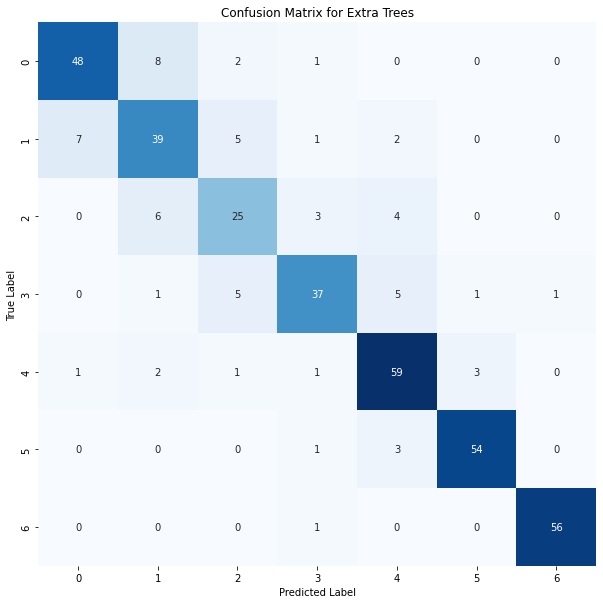

In [115]:
from sklearn.metrics import plot_confusion_matrix, confusion_matrix

plt.figure(figsize=(10, 10))
sns.heatmap(confusion_matrix(y_test, results), annot=True, cmap='Blues', fmt='g', cbar=False)
plt.title('Confusion Matrix for Extra Trees')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [116]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score

et_results = {
    'Number_of_estimators': [],
    'Criterion': [],
    'Max_samples': [],
    'Max_depth': [],
    'Accuracy_mean': [],
    'Accuracy_std': []
}

labels = ['D' + str(i) for i in range(7)]

for label in labels:
    et_results["Precision_mean_" + label] = []
    et_results["Precision_std_" + label] = []
    et_results["Recall_mean_" + label] = []
    et_results["Recall_std_" + label] = []
    et_results["F1_score_mean_" + label] = []
    et_results["F1_score_std_" + label] = []

for n_estimators in params['n_estimators']:
    for criterion in params['criterion']:
        for max_samples in params['max_samples']:
            for max_depth in params['max_depth']:
                model_results = {}
                model_results['acc'] = []
                
                for label in labels:
                    model_results['P ' + label] = []
                    model_results['R ' + label] = []
                    model_results['F1 ' + label] = []
                
                model = ExtraTreesClassifier(n_estimators=n_estimators, criterion=criterion, max_samples=max_samples, max_depth=max_depth, bootstrap=True)

                for (X_train, X_test, y_train, y_test) in random_splits:
                    model.fit(X_train, y_train)
                    y_pred = model.predict(X_test)

                    model_results['acc'].append(accuracy_score(y_test, y_pred))
                    
                    for label in labels:
                        model_results['P ' + label].append(precision_score(y_test, y_pred, average='macro', pos_label=label))
                        model_results['R ' + label].append(recall_score(y_test, y_pred, average='macro', pos_label=label))
                        model_results['F1 ' + label].append(f1_score(y_test, y_pred, average='macro', pos_label=label))
                
                et_results['Number_of_estimators'].append(n_estimators)
                et_results['Criterion'].append(criterion)
                et_results['Max_samples'].append(max_samples)
                et_results['Max_depth'].append(max_depth)

                et_results['Accuracy_mean'].append(np.mean(model_results['acc']))
                et_results['Accuracy_std'].append(np.std(model_results['acc']))

                for label in labels:
                    et_results['Precision_mean_' + label].append(np.mean(model_results['P ' + label]))
                    et_results['Recall_mean_' + label].append(np.mean(model_results['R ' + label]))
                    et_results['F1_score_mean_' + label].append(np.mean(model_results['F1 ' + label]))
                    et_results['Precision_std_' + label].append(np.std(model_results['P ' + label]))
                    et_results['Recall_std_' + label].append(np.std(model_results['R ' + label]))
                    et_results['F1_score_std_' + label].append(np.std(model_results['F1 ' + label]))

et_df = pd.DataFrame(et_results)

et_df.head()

/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1370: UserWarning: Note that pos_label (set to 'D0') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1370: UserWarning: Note that pos_label (set to 'D0') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1370: UserWarning: Note that pos_label (set to 'D0') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1370: UserWarning: Note that pos_label (set to 'D1') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to sp

,Number_of_estimators,Criterion,Max_samples,Max_depth,Accuracy_mean,Accuracy_std,Precision_mean_D0,Precision_std_D0,Recall_mean_D0,Recall_std_D0,...,Recall_mean_D5,Recall_std_D5,F1_score_mean_D5,F1_score_std_D5,Precision_mean_D6,Precision_std_D6,Recall_mean_D6,Recall_std_D6,F1_score_mean_D6,F1_score_std_D6
0,10,gini,0.2,3.0,0.555875,0.044424,0.564112,0.052260,0.542732,0.036950,...,0.542732,0.036950,0.500639,0.043687,0.564112,0.052260,0.542732,0.036950,0.500639,0.043687
1,10,gini,0.2,6.0,0.690339,0.030898,0.682919,0.031786,0.682232,0.031127,...,0.682232,0.031127,0.672047,0.034071,0.682919,0.031786,0.682232,0.031127,0.672047,0.034071
2,10,gini,0.2,9.0,0.749869,0.016129,0.740112,0.018433,0.745042,0.017813,...,0.745042,0.017813,0.737941,0.018402,0.740112,0.018433,0.745042,0.017813,0.737941,0.018402
3,10,gini,0.2,12.0,0.768146,0.023464,0.760685,0.024270,0.764117,0.021387,...,0.764117,0.021387,0.759497,0.023218,0.760685,0.024270,0.764117,0.021387,0.759497,0.023218
4,10,gini,0.6,3.0,0.546736,0.032300,0.559001,0.031201,0.539870,0.029334,...,0.539870,0.029334,0.500302,0.036993,0.559001,0.031201,0.539870,0.029334,0.500302,0.036993


In [117]:
et_df.to_csv('extra_trees_results.csv')

In [118]:
def transform_classes(y):
    return np.array([int(s[1:]) for s in y])

In [119]:
# 4. Grid Search for XGBoost

params = {
    "n_estimators": [10, 100, 1000],
    'max_depth': list(map(int, np.linspace(3, 12, 4))),
    'learning_rate': list(np.linspace(0.05, 0.2, 4)),
}

model = XGBClassifier()

grid_search = GridSearchCV(estimator=model, param_grid=params, cv=5)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

grid_search.fit(X_train, transform_classes(y_train))

results = grid_search.predict(X_test)

In [120]:
from sklearn.metrics import accuracy_score

accuracy_score(results, transform_classes(y_test))

0.8590078328981723

In [121]:
grid_search.best_params_

{'learning_rate': 0.15000000000000002, 'max_depth': 6, 'n_estimators': 100}

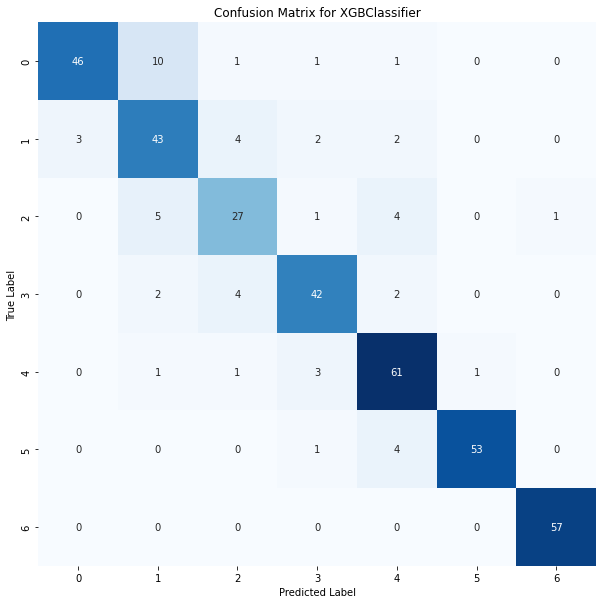

In [122]:
from sklearn.metrics import plot_confusion_matrix, confusion_matrix

plt.figure(figsize=(10, 10))
sns.heatmap(confusion_matrix(transform_classes(y_test), results), annot=True, cmap='Blues', fmt='g', cbar=False)
plt.title('Confusion Matrix for XGBClassifier')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [123]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score

xgb_results = {
    'Number_of_estimators': [],
    'Learning_rate': [],
    'Max_depth': [],
    'Accuracy_mean': [],
    'Accuracy_std': []
}

labels = ['D' + str(i) for i in range(7)]

for label in labels:
    xgb_results["Precision_mean_" + label] = []
    xgb_results["Precision_std_" + label] = []
    xgb_results["Recall_mean_" + label] = []
    xgb_results["Recall_std_" + label] = []
    xgb_results["F1_score_mean_" + label] = []
    xgb_results["F1_score_std_" + label] = []

for n_estimators in params['n_estimators']:
    for learning_rate in params['learning_rate']:
        for max_depth in params['max_depth']:
            model_results = {}
            model_results['acc'] = []
            
            for label in labels:
                model_results['P ' + label] = []
                model_results['R ' + label] = []
                model_results['F1 ' + label] = []
            
            model = XGBClassifier(n_estimators=n_estimators, max_depth=max_depth, learning_rate=learning_rate)

            for (X_train, X_test, y_train, y_test) in random_splits:
                model.fit(X_train, transform_classes(y_train))
                y_pred = model.predict(X_test)

                y_test = transform_classes(y_test)
                model_results['acc'].append(accuracy_score(y_test, y_pred))
                
                for label in labels:
                    model_results['P ' + label].append(precision_score(y_test, y_pred, average='macro', pos_label=label))
                    model_results['R ' + label].append(recall_score(y_test, y_pred, average='macro', pos_label=label))
                    model_results['F1 ' + label].append(f1_score(y_test, y_pred, average='macro', pos_label=label))
            
            xgb_results['Number_of_estimators'].append(n_estimators)
            xgb_results['Learning_rate'].append(learning_rate)
            xgb_results['Max_depth'].append(max_depth)

            xgb_results['Accuracy_mean'].append(np.mean(model_results['acc']))
            xgb_results['Accuracy_std'].append(np.std(model_results['acc']))

            for label in labels:
                xgb_results['Precision_mean_' + label].append(np.mean(model_results['P ' + label]))
                xgb_results['Recall_mean_' + label].append(np.mean(model_results['R ' + label]))
                xgb_results['F1_score_mean_' + label].append(np.mean(model_results['F1 ' + label]))
                xgb_results['Precision_std_' + label].append(np.std(model_results['P ' + label]))
                xgb_results['Recall_std_' + label].append(np.std(model_results['R ' + label]))
                xgb_results['F1_score_std_' + label].append(np.std(model_results['F1 ' + label]))

xgb_df = pd.DataFrame(xgb_results)

xgb_df.head()

/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1370: UserWarning: Note that pos_label (set to 'D0') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1370: UserWarning: Note that pos_label (set to 'D0') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1370: UserWarning: Note that pos_label (set to 'D0') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1370: UserWarning: Note that pos_label (set to 'D1') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to sp

,Number_of_estimators,Learning_rate,Max_depth,Accuracy_mean,Accuracy_std,Precision_mean_D0,Precision_std_D0,Recall_mean_D0,Recall_std_D0,F1_score_mean_D0,...,Recall_mean_D5,Recall_std_D5,F1_score_mean_D5,F1_score_std_D5,Precision_mean_D6,Precision_std_D6,Recall_mean_D6,Recall_std_D6,F1_score_mean_D6,F1_score_std_D6
0,10,0.05,3,0.658747,0.032043,0.658385,0.040629,0.656083,0.030679,0.644666,...,0.656083,0.030679,0.644666,0.038873,0.658385,0.040629,0.656083,0.030679,0.644666,0.038873
1,10,0.05,6,0.805744,0.017288,0.803643,0.021612,0.800302,0.019877,0.799979,...,0.800302,0.019877,0.799979,0.020437,0.803643,0.021612,0.800302,0.019877,0.799979,0.020437
2,10,0.05,9,0.836031,0.012939,0.832701,0.017065,0.831517,0.014162,0.830019,...,0.831517,0.014162,0.830019,0.015647,0.832701,0.017065,0.831517,0.014162,0.830019,0.015647
3,10,0.05,12,0.839426,0.011154,0.836005,0.015184,0.835150,0.013045,0.833470,...,0.835150,0.013045,0.833470,0.014383,0.836005,0.015184,0.835150,0.013045,0.833470,0.014383
4,10,0.10,3,0.672846,0.029748,0.677274,0.036220,0.667975,0.027763,0.661000,...,0.667975,0.027763,0.661000,0.030360,0.677274,0.036220,0.667975,0.027763,0.661000,0.030360


In [124]:
xgb_df.to_csv('xgb_classifier.csv')